# Assignment 6
- by Martim Silva 51304 and Alexandre Sobreira 59451

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import PIL
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, losses
import pathlib
from tensorflow.keras.models import Sequential
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.models import Model
import time
from tensorflow.keras.callbacks import TensorBoard

In [55]:
tensorboard_callback = TensorBoard(log_dir='./logs', histogram_freq=1)


class EpochTimeCallback(tf.keras.callbacks.Callback):
    def __init__(self):
        self.epoch_times = []
    
    def on_epoch_begin(self, epoch, logs=None):
        self.epoch_start_time = time.time()
    
    def on_epoch_end(self, epoch, logs=None):
        epoch_time = time.time() - self.epoch_start_time
        self.epoch_times.append(epoch_time)
        print(f"Epoch {epoch}: {epoch_time} seconds")
    
    def on_train_end(self, logs=None):
        avg_epoch_time = np.mean(self.epoch_times)
        print(f"Average time per epoch: {avg_epoch_time} seconds")


# Data

In [3]:
dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
data_dir = tf.keras.utils.get_file('flower_photos.tar', origin=dataset_url, extract=True)
data_dir = pathlib.Path(data_dir).with_suffix('')

228813984/228813984 [==============================] - 6s 0us/step


In [4]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

3670


# Pre Process

It's good practice to use a validation split when developing the model. We will 80% of the images for training and 20% for validation.

In [5]:
batch_size = 32
img_height = 180
img_width = 180

In [6]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3670 files belonging to 5 classes.
Using 2936 files for training.


In [7]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3670 files belonging to 5 classes.
Using 734 files for validation.


Class names in the `class_names` attribute on these datasets. 

In [8]:
class_names = train_ds.class_names
print(class_names)

['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']


Here are the first nine images from the training dataset:

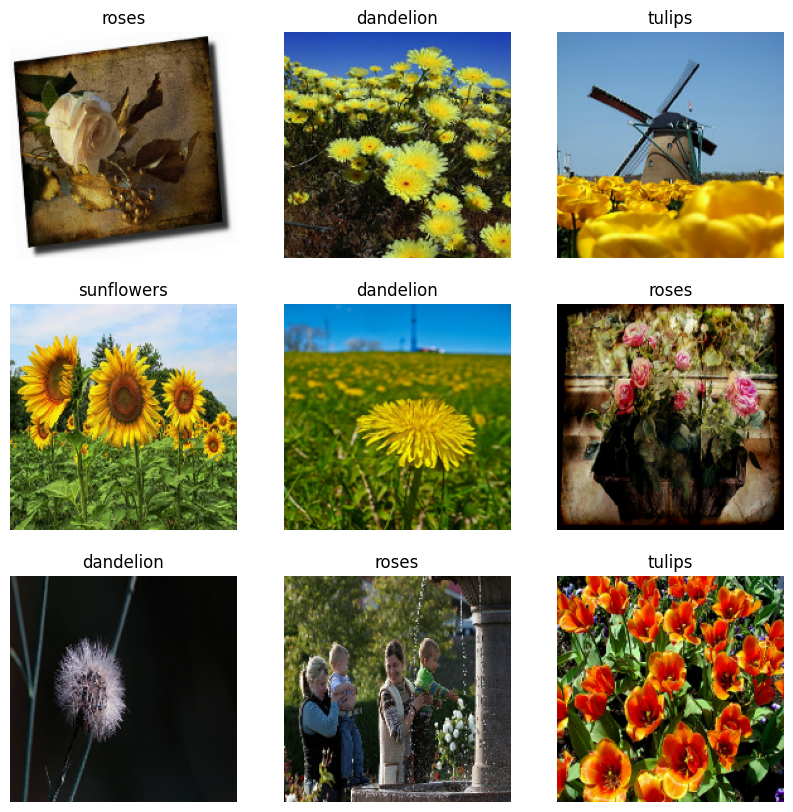

In [9]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [10]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 180, 180, 3)
(32,)


In [11]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

# Base Model


In [12]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

In [13]:
num_classes = len(class_names)

model = Sequential([
  data_augmentation,
  layers.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

In [14]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [15]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 180, 180, 3)       0         
                                                                 
 rescaling (Rescaling)       (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 90, 90, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                  

Train the model for 10 epochs with the Keras `Model.fit` method:

In [16]:
epochs=15
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[tensorboard_callback, EpochTimeCallback()]
)

Epoch 1/15
 5/92 [>.............................] - ETA: 2s - loss: 1.7254 - accuracy: 0.2500

92/92 [==============================] - 24s 72ms/step - loss: 1.2582 - accuracy: 0.4489 - val_loss: 1.1360 - val_accuracy: 0.5313
Epoch 2/15
92/92 [==============================] - 4s 45ms/step - loss: 1.0412 - accuracy: 0.5834 - val_loss: 0.9728 - val_accuracy: 0.6172
Epoch 3/15
92/92 [==============================] - 4s 40ms/step - loss: 0.9372 - accuracy: 0.6465 - val_loss: 1.0760 - val_accuracy: 0.5967
Epoch 4/15
92/92 [==============================] - 4s 39ms/step - loss: 0.8545 - accuracy: 0.6683 - val_loss: 0.8590 - val_accuracy: 0.6621
Epoch 5/15
92/92 [==============================] - 4s 45ms/step - loss: 0.8028 - accuracy: 0.6911 - val_loss: 0.7771 - val_accuracy: 0.6962
Epoch 6/15
92/92 [==============================] - 4s 39ms/step - loss: 0.7574 - accuracy: 0.7156 - val_loss: 0.7885 - val_accuracy: 0.7003
Epoch 7/15
92/92 [==============================] - 4s 40ms/step - loss: 0.7322 - accuracy: 0.7166 - val_loss: 0.7688 - val_accuracy: 0.7030
Epoch 8/15
92/92 [=====

# Problem 1
Create 4 different models, one at a time, by modifying the reference model in the following
manner:

## i) 
Using the mean squared error as a loss function.

In [17]:
num_classes = len(class_names)

model = Sequential([
  data_augmentation,
  layers.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

In [18]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.MeanSquaredError(),
              metrics=['accuracy'])

In [19]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 180, 180, 3)       0         
                                                                 
 rescaling_1 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 90, 90, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                  

In [20]:
epochs=15
history_mse = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[tensorboard_callback, EpochTimeCallback()]
)

Epoch 1/15
 5/92 [>.............................] - ETA: 3s - loss: 5.5922 - accuracy: 0.2250

92/92 [==============================] - 6s 44ms/step - loss: 1.8662 - accuracy: 0.1870 - val_loss: 1.4250 - val_accuracy: 0.2452
Epoch 2/15
92/92 [==============================] - 4s 46ms/step - loss: 1.3725 - accuracy: 0.2033 - val_loss: 1.6877 - val_accuracy: 0.2234
Epoch 3/15
92/92 [==============================] - 4s 40ms/step - loss: 1.2775 - accuracy: 0.2112 - val_loss: 1.1916 - val_accuracy: 0.2193
Epoch 4/15
92/92 [==============================] - 4s 40ms/step - loss: 1.2037 - accuracy: 0.2183 - val_loss: 1.1419 - val_accuracy: 0.1826
Epoch 5/15
92/92 [==============================] - 4s 46ms/step - loss: 1.1157 - accuracy: 0.2159 - val_loss: 1.1396 - val_accuracy: 0.2657
Epoch 6/15
92/92 [==============================] - 4s 41ms/step - loss: 1.1427 - accuracy: 0.2159 - val_loss: 1.0644 - val_accuracy: 0.2371
Epoch 7/15
92/92 [==============================] - 4s 40ms/step - loss: 1.1102 - accuracy: 0.1975 - val_loss: 1.4017 - val_accuracy: 0.2643
Epoch 8/15
92/92 [======

## ii) 
Using a dropout probability of 40%.

In [21]:
num_classes = len(class_names)

model = Sequential([
  data_augmentation,
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dropout(0.4),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

In [22]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [23]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 180, 180, 3)       0         
                                                                 
 rescaling_2 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 90, 90, 16)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                  

In [24]:
epochs=15
history_dropout40 = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[tensorboard_callback, EpochTimeCallback()]
)

Epoch 1/15
 5/92 [>.............................] - ETA: 2s - loss: 2.1497 - accuracy: 0.2438

92/92 [==============================] - 6s 38ms/step - loss: 1.3516 - accuracy: 0.4213 - val_loss: 1.0801 - val_accuracy: 0.5627
Epoch 2/15
92/92 [==============================] - 3s 34ms/step - loss: 1.0355 - accuracy: 0.5967 - val_loss: 1.0120 - val_accuracy: 0.6199
Epoch 3/15
92/92 [==============================] - 3s 35ms/step - loss: 0.9266 - accuracy: 0.6417 - val_loss: 0.9061 - val_accuracy: 0.6485
Epoch 4/15
92/92 [==============================] - 4s 39ms/step - loss: 0.8829 - accuracy: 0.6638 - val_loss: 0.9154 - val_accuracy: 0.6676
Epoch 5/15
92/92 [==============================] - 3s 34ms/step - loss: 0.8144 - accuracy: 0.6843 - val_loss: 0.8282 - val_accuracy: 0.6730
Epoch 6/15
92/92 [==============================] - 3s 34ms/step - loss: 0.7894 - accuracy: 0.6945 - val_loss: 0.8678 - val_accuracy: 0.6757
Epoch 7/15
92/92 [==============================] - 3s 34ms/step - loss: 0.7495 - accuracy: 0.7095 - val_loss: 0.8718 - val_accuracy: 0.6649
Epoch 8/15
92/92 [======

## iii) 
Using a batch size of 8.

In [25]:
batch_size = 8
img_height = 180
img_width = 180

In [26]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3670 files belonging to 5 classes.
Using 2936 files for training.


In [27]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3670 files belonging to 5 classes.
Using 734 files for validation.


In [28]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [29]:
num_classes = len(class_names)

model = Sequential([
  data_augmentation,  
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dropout(0.2),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

In [30]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [31]:
epochs=15
history_batch08 = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[tensorboard_callback, EpochTimeCallback()]
)

Epoch 1/15
  5/367 [..............................] - ETA: 5s - loss: 2.2951 - accuracy: 0.2500   

367/367 [==============================] - 13s 14ms/step - loss: 1.2797 - accuracy: 0.4527 - val_loss: 1.0461 - val_accuracy: 0.5954
Epoch 2/15
367/367 [==============================] - 4s 11ms/step - loss: 1.0228 - accuracy: 0.5957 - val_loss: 1.0149 - val_accuracy: 0.5899
Epoch 3/15
367/367 [==============================] - 5s 13ms/step - loss: 0.9378 - accuracy: 0.6407 - val_loss: 0.9035 - val_accuracy: 0.6540
Epoch 4/15
367/367 [==============================] - 4s 11ms/step - loss: 0.8573 - accuracy: 0.6608 - val_loss: 0.7851 - val_accuracy: 0.6935
Epoch 5/15
367/367 [==============================] - 4s 11ms/step - loss: 0.8100 - accuracy: 0.6958 - val_loss: 0.8049 - val_accuracy: 0.6744
Epoch 6/15
367/367 [==============================] - 6s 16ms/step - loss: 0.7634 - accuracy: 0.7081 - val_loss: 0.8325 - val_accuracy: 0.6853
Epoch 7/15
367/367 [==============================] - 4s 11ms/step - loss: 0.7291 - accuracy: 0.7176 - val_loss: 0.7961 - val_accuracy: 0.7071
Epoch 8/1

## iv) 
Using batch normalization.

In [32]:
batch_size = 32
img_height = 180
img_width = 180

In [33]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3670 files belonging to 5 classes.
Using 2936 files for training.


In [34]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3670 files belonging to 5 classes.
Using 734 files for validation.


In [35]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [36]:
num_classes = len(class_names)

model = Sequential([
  data_augmentation, 
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dropout(0.2),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

In [37]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [38]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 180, 180, 3)       0         
                                                                 
 rescaling_4 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_12 (Conv2D)          (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 90, 90, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 45, 45, 32)       0         
 g2D)                                                 

In [39]:
epochs=15
history_batchNorm = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[tensorboard_callback, EpochTimeCallback()]
)

Epoch 1/15
 5/92 [>.............................] - ETA: 2s - loss: 2.6007 - accuracy: 0.1813

92/92 [==============================] - 12s 43ms/step - loss: 1.4368 - accuracy: 0.3753 - val_loss: 1.0861 - val_accuracy: 0.5654
Epoch 2/15
92/92 [==============================] - 3s 31ms/step - loss: 1.0804 - accuracy: 0.5640 - val_loss: 1.1859 - val_accuracy: 0.5082
Epoch 3/15
92/92 [==============================] - 3s 33ms/step - loss: 0.9794 - accuracy: 0.6226 - val_loss: 1.0432 - val_accuracy: 0.5886
Epoch 4/15
92/92 [==============================] - 3s 32ms/step - loss: 0.8796 - accuracy: 0.6638 - val_loss: 0.8435 - val_accuracy: 0.6649
Epoch 5/15
92/92 [==============================] - 3s 31ms/step - loss: 0.8201 - accuracy: 0.6924 - val_loss: 0.8226 - val_accuracy: 0.6812
Epoch 6/15
92/92 [==============================] - 3s 32ms/step - loss: 0.7667 - accuracy: 0.7176 - val_loss: 0.9245 - val_accuracy: 0.6567
Epoch 7/15
92/92 [==============================] - 3s 34ms/step - loss: 0.7233 - accuracy: 0.7296 - val_loss: 0.7413 - val_accuracy: 0.7153
Epoch 8/15
92/92 [=====

## v) 
Combine modifications ii, iii and iv.

In [40]:
batch_size = 8
img_height = 180
img_width = 180

In [41]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3670 files belonging to 5 classes.
Using 2936 files for training.


In [42]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3670 files belonging to 5 classes.
Using 734 files for validation.


In [43]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [44]:
num_classes = len(class_names)

model = Sequential([
  data_augmentation, 
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Dropout(0.4),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

In [45]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [46]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 180, 180, 3)       0         
                                                                 
 rescaling_5 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_15 (Conv2D)          (None, 180, 180, 16)      448       
                                                                 
 batch_normalization (BatchN  (None, 180, 180, 16)     64        
 ormalization)                                                   
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 90, 90, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_16 (Conv2D)          (None, 90, 90, 32)       

In [47]:
epochs = 15
history_full = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[tensorboard_callback, EpochTimeCallback()]
)

Epoch 1/15
  4/367 [..............................] - ETA: 6s - loss: 6.6691 - accuracy: 0.2188       

367/367 [==============================] - 15s 19ms/step - loss: 1.9378 - accuracy: 0.4285 - val_loss: 6.1130 - val_accuracy: 0.3065
Epoch 2/15
367/367 [==============================] - 6s 16ms/step - loss: 1.2323 - accuracy: 0.5017 - val_loss: 1.2343 - val_accuracy: 0.5272
Epoch 3/15
367/367 [==============================] - 6s 17ms/step - loss: 1.1107 - accuracy: 0.5436 - val_loss: 1.4883 - val_accuracy: 0.4823
Epoch 4/15
367/367 [==============================] - 6s 17ms/step - loss: 1.0477 - accuracy: 0.5715 - val_loss: 1.2959 - val_accuracy: 0.5409
Epoch 5/15
367/367 [==============================] - 6s 17ms/step - loss: 1.0221 - accuracy: 0.5933 - val_loss: 2.1522 - val_accuracy: 0.3556
Epoch 6/15
367/367 [==============================] - 6s 16ms/step - loss: 1.0294 - accuracy: 0.6015 - val_loss: 1.5458 - val_accuracy: 0.5259
Epoch 7/15
367/367 [==============================] - 6s 16ms/step - loss: 0.9645 - accuracy: 0.6277 - val_loss: 0.9943 - val_accuracy: 0.6335
Epoch 8/1

## Results
Compare the models (including the reference model) in terms of accuracy and loss values, and
verify the learning curves for train and validation sets. Also, record the number of epochs until
overfit and the average time per epoch. *Texto em itálico*

### Accuracy

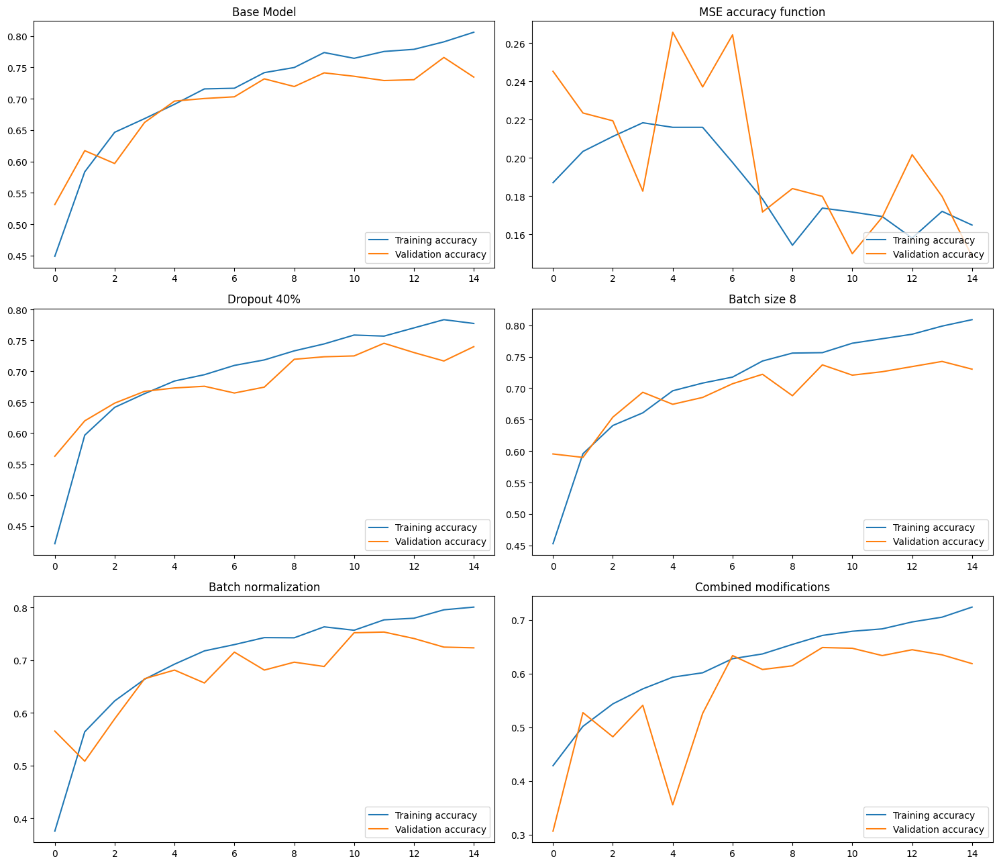

In [133]:
epochs_range = range(epochs)

plt.rcParams["figure.figsize"] = (8,8)

accuracy_base = history.history['accuracy']
val_accuracy_base = history.history['val_accuracy']

accuracy_mse = history_mse.history['accuracy']
val_accuracy_mse = history_mse.history['val_accuracy']

accuracy_drop40 = history_dropout40.history['accuracy']
val_accuracy_drop40 = history_dropout40.history['val_accuracy']

accuracy_batch8 = history_batch08.history['accuracy']
val_accuracy_batch8 = history_batch08.history['val_accuracy']

accuracy_batchNormalization = history_batchNorm.history['accuracy']
val_accuracy_batchNormalization = history_batchNorm.history['val_accuracy']

accuracy_combined = history_full.history['accuracy']
val_accuracy_combined = history_full.history['val_accuracy']


fig, axs = plt.subplots(3, 2, figsize=(15, 13))

axs[0, 0].plot(epochs_range, accuracy_base, label='Training accuracy')
axs[0, 0].plot(epochs_range, val_accuracy_base, label='Validation accuracy')
axs[0, 0].set_title("Base Model")
axs[0, 0].legend(loc='lower right')
axs[0, 1].plot(epochs_range, accuracy_mse, label='Training accuracy')
axs[0, 1].plot(epochs_range, val_accuracy_mse, label='Validation accuracy')
axs[0, 1].set_title("MSE accuracy function")
axs[0, 1].legend(loc='lower right')
axs[1, 0].plot(epochs_range, accuracy_drop40, label='Training accuracy')
axs[1, 0].plot(epochs_range, val_accuracy_drop40, label='Validation accuracy')
axs[1, 0].set_title("Dropout 40%")
axs[1, 0].legend(loc='lower right')
axs[1, 1].plot(epochs_range, accuracy_batch8, label='Training accuracy')
axs[1, 1].plot(epochs_range, val_accuracy_batch8, label='Validation accuracy')
axs[1, 1].set_title("Batch size 8")
axs[1, 1].legend(loc='lower right')
axs[2, 0].plot(epochs_range, accuracy_batchNormalization, label='Training accuracy')
axs[2, 0].plot(epochs_range, val_accuracy_batchNormalization, label='Validation accuracy')
axs[2, 0].set_title("Batch normalization")
axs[2, 0].legend(loc='lower right')
axs[2, 1].plot(epochs_range, accuracy_combined, label='Training accuracy')
axs[2, 1].plot(epochs_range, val_accuracy_combined, label='Validation accuracy')
axs[2, 1].set_title("Combined modifications")
axs[2, 1].legend(loc='lower right')

fig.tight_layout()
plt.show()


### Loss

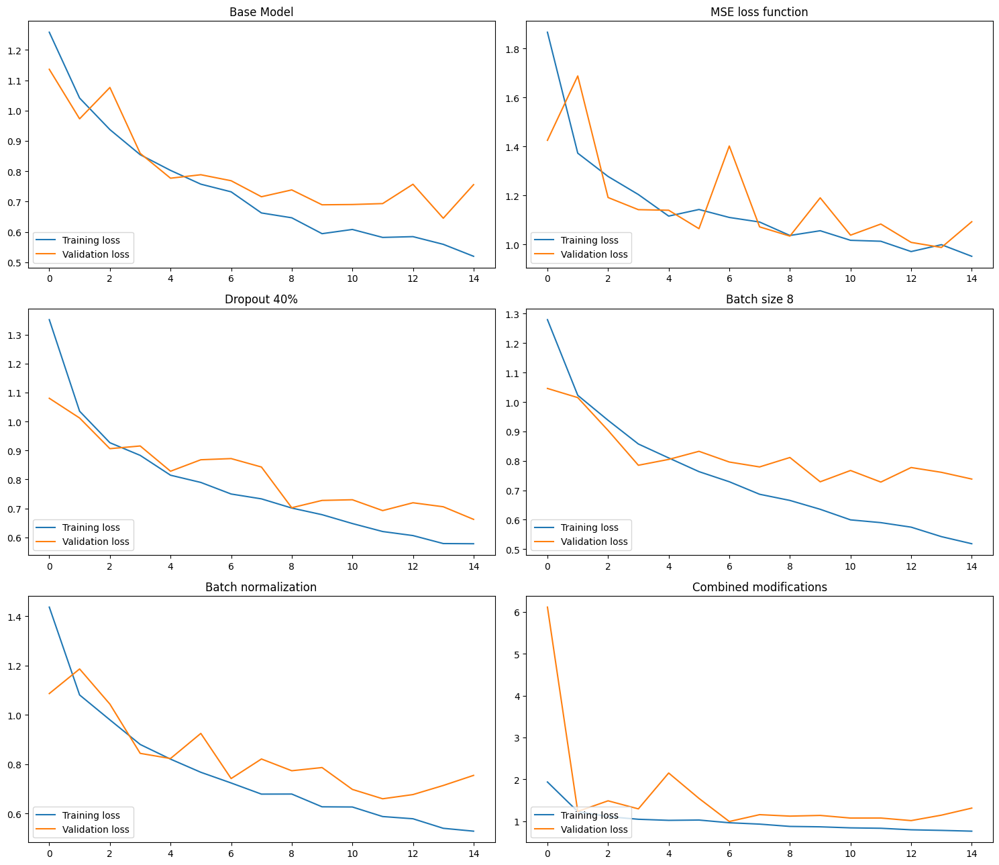

In [134]:
plt.rcParams["figure.figsize"] = (8, 8)

loss_base = history.history['loss']
val_loss_base = history.history['val_loss']

loss_mse = history_mse.history['loss']
val_loss_mse = history_mse.history['val_loss']

loss_drop40 = history_dropout40.history['loss']
val_loss_drop40 = history_dropout40.history['val_loss']

loss_batch8 = history_batch08.history['loss']
val_loss_batch8 = history_batch08.history['val_loss']

loss_batchNormalization = history_batchNorm.history['loss']
val_loss_batchNormalization = history_batchNorm.history['val_loss']

loss_combined = history_full.history['loss']
val_loss_combined = history_full.history['val_loss']

fig, axs = plt.subplots(3, 2, figsize=(15, 13))

axs[0, 0].plot(epochs_range, loss_base, label='Training loss')
axs[0, 0].plot(epochs_range, val_loss_base, label='Validation loss')
axs[0, 0].set_title("Base Model")
axs[0, 0].legend(loc='lower left')
axs[0, 1].plot(epochs_range, loss_mse, label='Training loss')
axs[0, 1].plot(epochs_range, val_loss_mse, label='Validation loss')
axs[0, 1].set_title("MSE loss function")
axs[0, 1].legend(loc='lower left')
axs[1, 0].plot(epochs_range, loss_drop40, label='Training loss')
axs[1, 0].plot(epochs_range, val_loss_drop40, label='Validation loss')
axs[1, 0].set_title("Dropout 40%")
axs[1, 0].legend(loc='lower left')
axs[1, 1].plot(epochs_range, loss_batch8, label='Training loss')
axs[1, 1].plot(epochs_range, val_loss_batch8, label='Validation loss')
axs[1, 1].set_title("Batch size 8")
axs[1, 1].legend(loc='lower left')
axs[2, 0].plot(epochs_range, loss_batchNormalization, label='Training loss')
axs[2, 0].plot(epochs_range, val_loss_batchNormalization, label='Validation loss')
axs[2, 0].set_title("Batch normalization")
axs[2, 0].legend(loc='lower left')
axs[2, 1].plot(epochs_range, loss_combined, label='Training loss')
axs[2, 1].plot(epochs_range, val_loss_combined, label='Validation loss')
axs[2, 1].set_title("Combined modifications")
axs[2, 1].legend(loc='lower left')

fig.tight_layout()
plt.show()


## Discussion

- A possible sign of overfiting is the training loss continue to decrease, while the validation loss will start to increase or the oposite to the accuracy. This is because the model is fitting the training data too closely, and is starting to generalize poorly to new data. Therefore, we will  look for the point in the plot where the validation loss starts to increase while the training loss continues to decrease as a sign of overfitting. Also, the difference in accuracy between training and validation accuracy can be a  noticeable—a sign of overfiting.

### Base Model
- For the base model the accuracy and loss curve is increasing and decreasing respectively in a generally stable rate (slightly  less so for validation as expected) with two details of note around the second and penultimate epochs where the model is showing patterns that resemble the phenomenon known as overfitting where the model takes the details and possible noisy cases in the data to extreme importances which results in damaging the quality of the predictions.

### MSE as LOSS
- When observing the Accuracy and Loss curves for the Model using the Mean Squared Error loss function, first is possible to see that the levels of accuracy never go above .26, which is extremely low. Another marking aspect is that instead of rising, the accuracy for the training set tends to decrease with the number of epochs which is not observed in the loss plot where the loss value decreases naturally which is what is expected. For the validation set the accuracy behaviour as well as the loss seems to be quite chaotic presenting various points where overfitting could be occurring. For example at epoch  2 or epoch 9 where the validation line goes in the opposite direction of the training line.
- There is a better-suited loss function for CNNs such as the cross-entropy which is less prone to overfitting. The MSE also does not provide a lot of information about the quality of the predictions, it only tells us how far the predicted value is from the actual ones, as a result, the fluctuations observed in the plots may not reflect meaningful changes in the model's performance

### Dropout
- Through the use of Dropout layers, which is taking chances in a layer to not activate a node (40% in this model) we introduce regularization to the model with the goal of decreasing the natural propensity of neural networks with their many parameters of overfitting
- For the 40% dropout model the accuracy curve in the training set is increasing well save for a few epochs in the middle of the training step, this is completemented with the values of validation where there is a slight dip in accuracy in epochs six, seven and ten but without any drastic signs of overfitting for the training and validation sets.
- For the loss in the validation data there are small arcs where the loss increases and diminishes again to expected values similar to the distribution of accuracy values mentioned above. 

### Batch of size 8
- The Accuracy and Loss plots for the Base Model using a Batch size of 8 instead of 32 show a stable learning curve for the training set but for the validation there seems to be an overfitting point which is at epoch 3 from which the validation curve stays bellow the training (accuracy) an above the training (loss) until the last epoch, indicating a possible overfitted model. This Model reaches similar accuracy levels when compared with the Base Model.

### Batch Normalization
- Adding Batch Normalization to a model serves the purpose of standardizing (output mean near 0 and output standard deviation near 1) the inputs that are fed to the neural network, which are done through several batches of values of a set size each, this in turn would in theory cause a stabilizing effect on the determination of the values of the weights during training and also make this process faster to compute.
- Analysing our training accuracy curve for the Batch Normalized model we see the grow in accuracy is smooth until epoch 8 where it starts to oscilate ever so slightly. When observing the validation accuracy this effect not only takes place right at epoch 1 but the values are more disparate between eachother. Regarding the loss values the training and validation values decrease in the same fashion as they increased in the accuracy metric.

### All Modifications
- For the Model with all the modifications, first of all, the accuracy didn't reach levels of accuracy as high as the Base Model, obtaining .7 instead of .8, in the training,  which can already be a sign of reduced overfitting. The learning curve for the training is very stable, increasing normally until the 15 epoch with low loss values all the time. The validation curve isn't as stable showing a possible overfitting at epoch 4 but afterwards stabilizing until the last epoch.


### Number of epochs until overfit

In [9]:
model_names = ['Base Model', 'MSE loss function', 'Dropout 40%', 'Batch size 8', 'Batch normalization', 'Combined modifications']
epochs_til_overfit = [4, "-", 2, 4, 4, 6]
epochs_til_overfit = {'Model': model_names, 'Nr epochs until overfit': epochs_til_overfit}
df = pd.DataFrame(epochs_til_overfit)
print(df)

                    Model Nr epochs until overfit
0              Base Model                       4
1       MSE loss function                       -
2             Dropout 40%                       2
3            Batch size 8                       4
4     Batch normalization                       4
5  Combined modifications                       6


- The model with all modifictaion seem to be the one which presents signs of overfiting later in the number of epochs
- For the MSE, no clean interpretation was possible to retrieve in terms of possible overfiting spots.

### Average time per epoch

In [53]:
model_names = ['Base Model', 'MSE loss function', 'Dropout 40%', 'Batch size 8', 'Batch normalization', 'Combined modifications']
avg_epoch_times = [5.214, 3.961, 3.412, 4.950, 3.503, 6.593]
data = {'Model': model_names, 'Avg Epoch Time': avg_epoch_times}
df = pd.DataFrame(data)
print(df)


                    Model  Avg Epoch Time
0              Base Model           5.214
1       MSE loss function           3.961
2             Dropout 40%           3.412
3            Batch size 8           4.950
4     Batch normalization           3.503
5  Combined modifications           6.593


-The models with a higher average time per epoch seems to be the model with all the modificitions which makes sense given it has more processes to apply

# Problem 2
Implement an autoencoder to learn to encode images from the dataset given in the image classification
tutorial, based on the reference model used in the previous exercise.

## Pre Processing

In [56]:
dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
data_dir = tf.keras.utils.get_file('flower_photos.tar', origin=dataset_url, extract=True)
data_dir = pathlib.Path(data_dir).with_suffix('')

In [57]:
batch_size = 32
img_height = 180
img_width = 180

In [58]:
# set training set
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=1-(3500/3670),
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3670 files belonging to 5 classes.
Using 3500 files for training.


In [59]:
# set validation set
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=1-(3500/3670),
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3670 files belonging to 5 classes.
Using 170 files for validation.


In [60]:
# performance configuration
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [61]:
# normalization
normalization_layer = layers.Rescaling(1./255)
train_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
val_ds = val_ds.map(lambda x, y: (normalization_layer(x), y))

In [62]:
# remove layers
train_ds = np.concatenate([x for x, y in train_ds], axis=0)
val_ds = np.concatenate([x for x, y in val_ds], axis=0)

# convert to tensor
train_ds = tf.convert_to_tensor(train_ds)
val_ds = tf.convert_to_tensor(val_ds)

## a) 
Train an autoencoder on 3500 images from the image classification dataset, leaving 170 aside for validation.

#### Base Model

In [63]:
model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dropout(0.2),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

### Autoenconder Tutorial 

In [64]:
latent_dim = 64 

class Autoencoder(Model):
  def __init__(self, latent_dim):
    super(Autoencoder, self).__init__()
    self.latent_dim = latent_dim   
    self.encoder = tf.keras.Sequential([
      layers.Flatten(),
      layers.Dense(latent_dim, activation='relu'),
    ])
    self.decoder = tf.keras.Sequential([
      layers.Dense(784, activation='sigmoid'),
      layers.Reshape((28, 28))
    ])

  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded
  
autoencoder = Autoencoder(latent_dim) 

### New Autoencoder

In [104]:
latent_dim = 64

class Autoencoder(Model):
  def __init__(self, latent_dim):
    super(Autoencoder, self).__init__()
    self.latent_dim = latent_dim
    self.encoder = tf.keras.Sequential([
      layers.Input(shape = (180, 180, 3)),
      layers.Conv2D(16, 3, activation='relu', padding='same'),
      layers.MaxPooling2D(),
      layers.Conv2D(32, 3, activation='relu', padding='same'),
      layers.MaxPooling2D(),
      layers.Conv2D(64, 3, activation='relu', padding='same'),
      layers.MaxPooling2D(),
      layers.Dropout(.2),
      layers.Flatten(),
      layers.Dense(latent_dim)
      ])

    self.decoder = tf.keras.Sequential([
      layers.Dense(45*45*64, activation = "relu"),
      layers.Reshape((45, 45, 64)),
      layers.Conv2DTranspose(32, 3, activation='relu', padding='same'),
      layers.UpSampling2D(),
      layers.Conv2DTranspose(16, 3, activation='relu', padding='same'),
      layers.UpSampling2D(),
      layers.Conv2DTranspose(3, 3, activation='sigmoid', padding='same'),
      ])

  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded

autoencoder = Autoencoder(latent_dim)

In [105]:
autoencoder.compile(optimizer='adam', loss=losses.MeanSquaredError())

In [106]:
autoencoder.fit(train_ds, train_ds,
                epochs=15,
                shuffle=True,
                batch_size = batch_size,
                validation_data=(val_ds, val_ds))

Epoch 1/15
110/110 [==============================] - 10s 55ms/step - loss: 0.0671 - val_loss: 0.0493
Epoch 2/15
110/110 [==============================] - 6s 55ms/step - loss: 0.0441 - val_loss: 0.0391
Epoch 3/15
110/110 [==============================] - 6s 54ms/step - loss: 0.0371 - val_loss: 0.0350
Epoch 4/15
110/110 [==============================] - 6s 55ms/step - loss: 0.0334 - val_loss: 0.0324
Epoch 5/15
110/110 [==============================] - 6s 53ms/step - loss: 0.0302 - val_loss: 0.0297
Epoch 6/15
110/110 [==============================] - 6s 55ms/step - loss: 0.0276 - val_loss: 0.0282
Epoch 7/15
110/110 [==============================] - 6s 53ms/step - loss: 0.0258 - val_loss: 0.0275
Epoch 8/15
110/110 [==============================] - 6s 54ms/step - loss: 0.0243 - val_loss: 0.0267
Epoch 9/15
110/110 [==============================] - 6s 54ms/step - loss: 0.0229 - val_loss: 0.0264
Epoch 10/15
110/110 [==============================] - 6s 53ms/step - loss: 0.0217 - val_l

In [108]:
autoencoder.encoder.summary()

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_36 (Conv2D)          (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_33 (MaxPoolin  (None, 90, 90, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_37 (Conv2D)          (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_34 (MaxPoolin  (None, 45, 45, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_38 (Conv2D)          (None, 45, 45, 64)        18496     
                                                                 
 max_pooling2d_35 (MaxPoolin  (None, 22, 22, 64)     

## b) 
Sample 3 examples from each dataset split, the train and validation set, and use the autoencoder to encode and decode the images, comparing them with the original.

In [113]:
# select only 3 images from training and validation set
original_train_3imgs = train_ds[12:16]
original_val_3imgs = val_ds[12:16] 

In [114]:
encoded_train_3imgs = autoencoder.encoder(original_train_3imgs).numpy()
decoded_train_3imgs = autoencoder.decoder(encoded_train_3imgs).numpy()

encoded_val_3imgs = autoencoder.encoder(original_val_3imgs).numpy()
decoded_val_3imgs = autoencoder.decoder(encoded_val_3imgs).numpy()


In [119]:
def image_plot(original_imgs, reconstructed_imgs, n):
  plt.figure(figsize = (12,6))
  for i in range(n):

    # display original
    ax = plt.subplot(2, n, i + 1)
    plt.title("original")
    plt.imshow(original_imgs[i].numpy())
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    bx = plt.subplot(2, n, i + n + 1)
    plt.title("reconstructed")
    plt.imshow(tf.squeeze(reconstructed_imgs[i]))
    bx.get_xaxis().set_visible(False)
    bx.get_yaxis().set_visible(False)
  plt.show()

Train set:



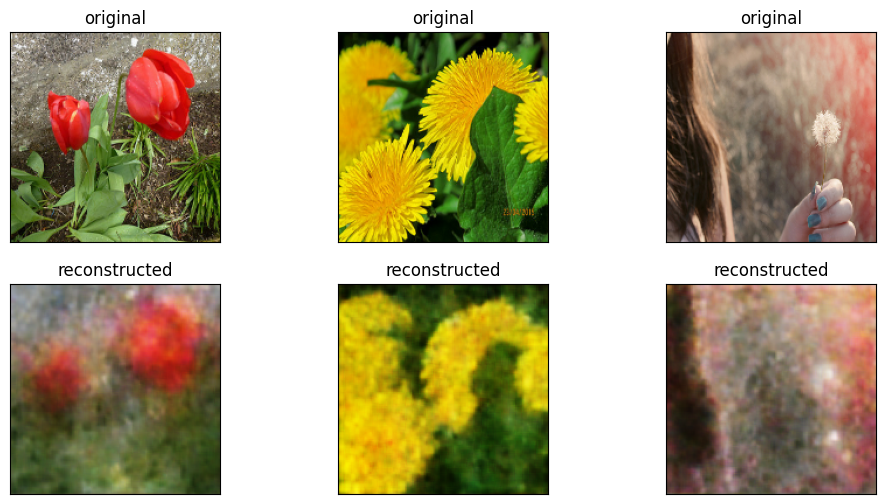


 Validation set:



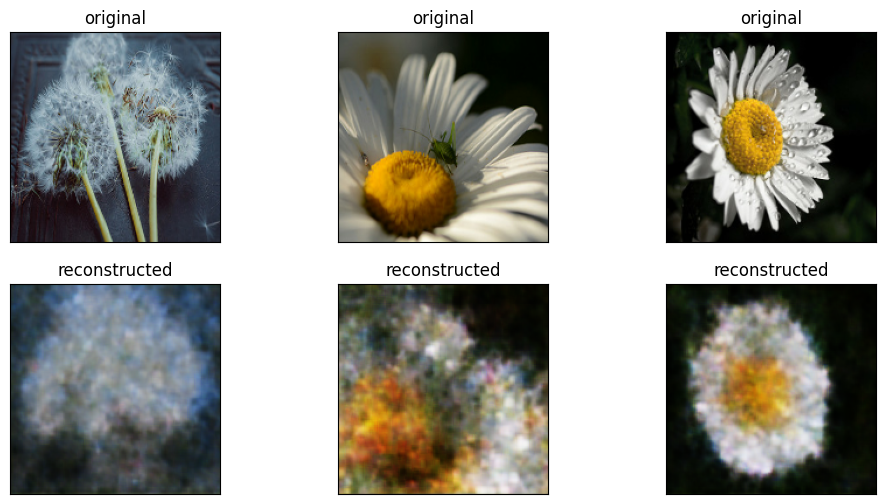

In [120]:
print("Train set:\n")
image_plot(original_train_3imgs, decoded_train_3imgs, 3)

print("\n Validation set:\n")
image_plot(original_val_3imgs, decoded_val_3imgs, 3)

These images were passed through a trained autoencoder that represented the features of each image (many arrays of 3 floating point values representing a pixel colored using the RGB color mixing mode) into another (smaller) set of dimensions and then attempted from that representation (the encoded image) to return it to it's original plane (decoded image) without losing too much information about the image in the end. The entities which carried out this compression are known as convolutional layers.
Comparing the original with the reconstructed images we can notice a significant loss of detail and an abstraction of larger concepts that make up the content of the images into loosely representative "blobs" of their former selves consisting of one or two colors of the original entity the image represented and not much else (ex: Bug in validation set). Also to note that finer smaller objects are conquered by whatever surrounds them.

## c) 
Sample 3 examples from each dataset split, the train and validation set, encoding the images using the Encoder, obtaining the intermediate representations. Using the GaussianNoise layer, introduce 5%, 10% and 20% noise to the representations. Finally, decode the representations using the Decoder and analyze the obtained images.

### 5%

In [121]:
encoded_train_3imgs = autoencoder.encoder(original_train_3imgs).numpy()
noise5_train = tf.keras.layers.GaussianNoise(0.05)(encoded_train_3imgs,training=True)
decoded_train_3imgs_n5 = autoencoder.decoder(noise5_train).numpy()

encoded_val_3imgs = autoencoder.encoder(original_val_3imgs).numpy()
noise5_val = tf.keras.layers.GaussianNoise(0.05)(encoded_val_3imgs,training=True)
decoded_val_3imgs_n5 = autoencoder.decoder(noise5_val).numpy()

Train set:



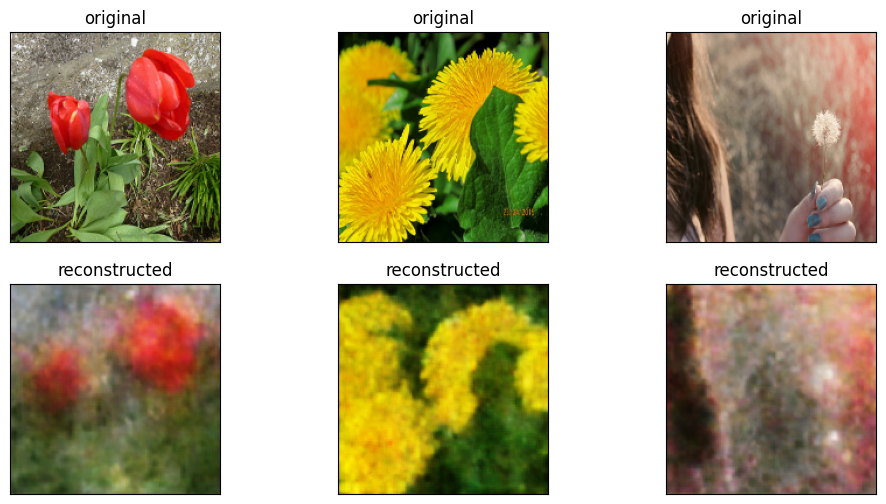


 Validation set:



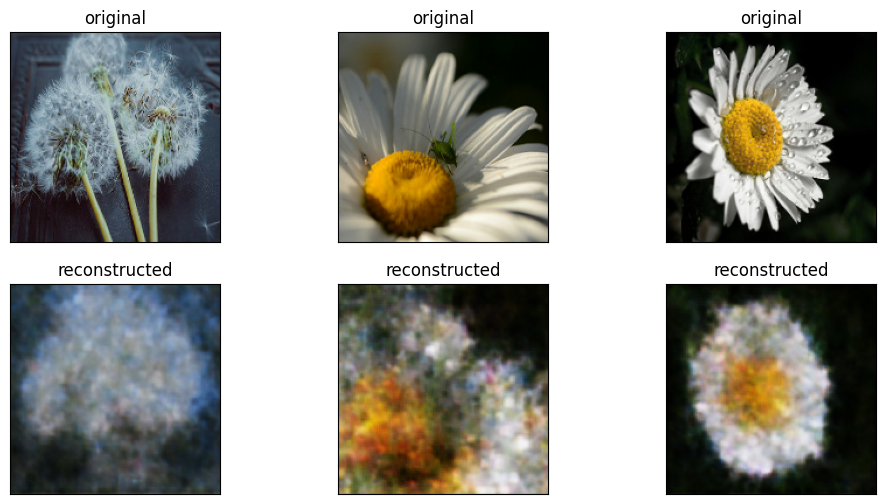

In [122]:
print("Train set:\n")
image_plot(original_train_3imgs, decoded_train_3imgs_n5, 3)

print("\n Validation set:\n")
image_plot(original_val_3imgs, decoded_val_3imgs_n5, 3)

### 10%

In [123]:
encoded_train_3imgs = autoencoder.encoder(original_train_3imgs).numpy()
noise10_train = tf.keras.layers.GaussianNoise(0.1)(encoded_train_3imgs,training=True)
decoded_train_3imgs_n10 = autoencoder.decoder(noise10_train).numpy()

encoded_val_3imgs = autoencoder.encoder(original_val_3imgs).numpy()
noise10_val = tf.keras.layers.GaussianNoise(0.1)(encoded_val_3imgs,training=True)
decoded_val_3imgs_n10 = autoencoder.decoder(noise10_val).numpy()

Train set:



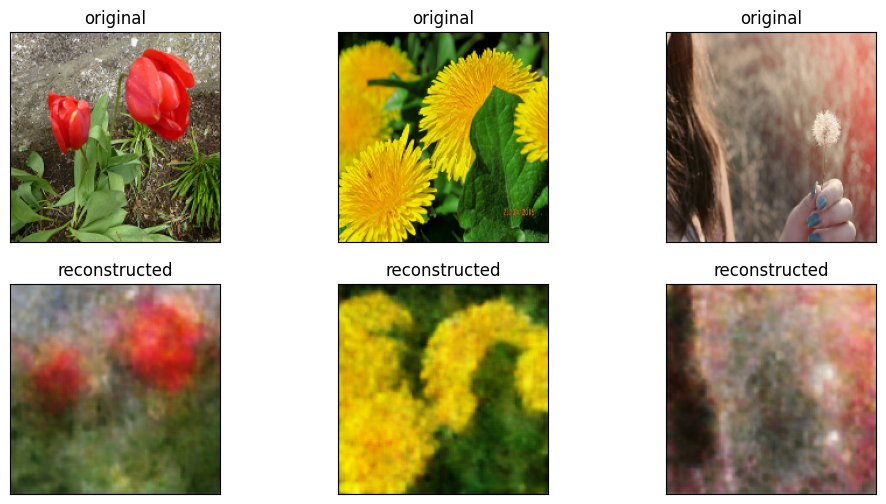


 Validation set:



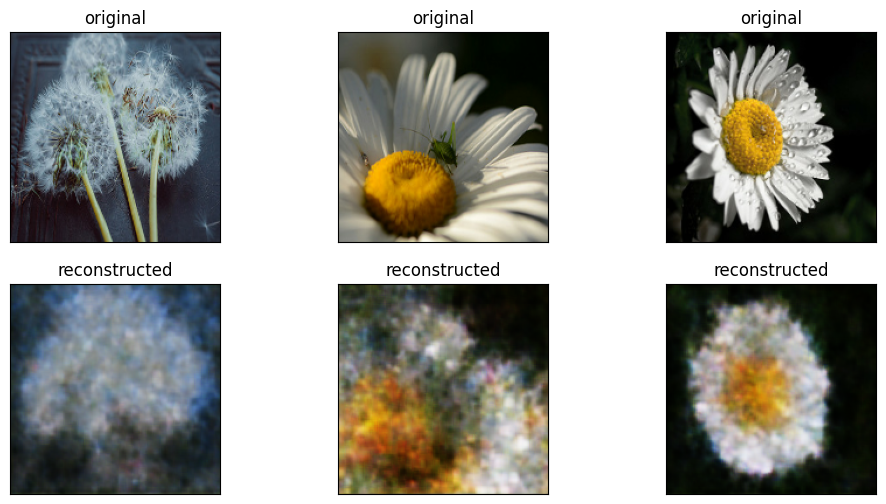

In [124]:
print("Train set:\n")
image_plot(original_train_3imgs, decoded_train_3imgs_n10, 3)

print("\n Validation set:\n")
image_plot(original_val_3imgs, decoded_val_3imgs_n10, 3)

### 20%

In [125]:
encoded_train_3imgs = autoencoder.encoder(original_train_3imgs).numpy()
noise20_train = tf.keras.layers.GaussianNoise(0.2)(encoded_train_3imgs,training=True)
decoded_train_3imgs_n20 = autoencoder.decoder(noise20_train).numpy()

encoded_val_3imgs = autoencoder.encoder(original_val_3imgs).numpy()
noise20_val = tf.keras.layers.GaussianNoise(0.2)(encoded_val_3imgs,training=True)
decoded_val_3imgs_n20 = autoencoder.decoder(noise20_val).numpy()

Train set:



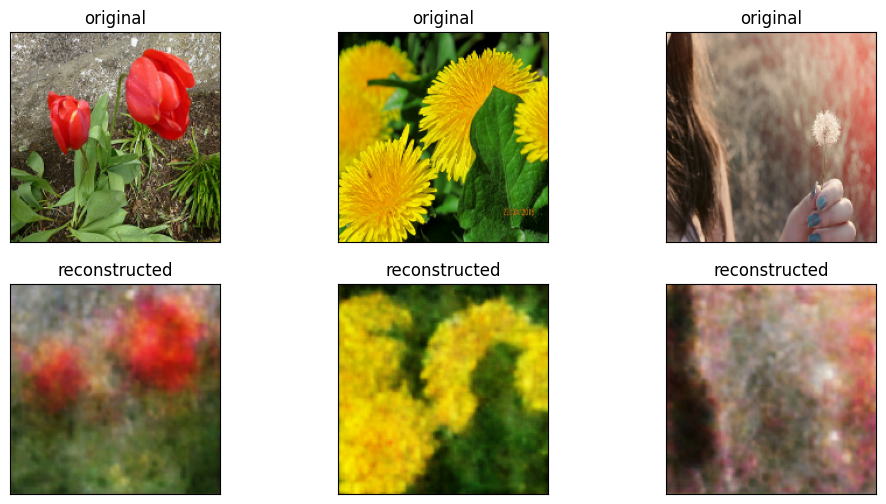


 Validation set:



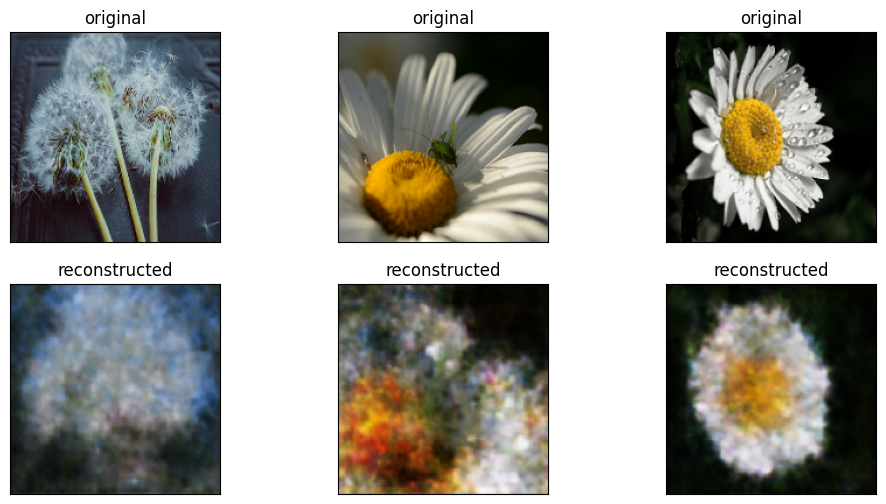

In [126]:
print("Train set:\n")
image_plot(original_train_3imgs, decoded_train_3imgs_n20, 3)

print("\n Validation set:\n")
image_plot(original_val_3imgs, decoded_val_3imgs_n20, 3)

The introduction of Gaussian Noise layer in the encoded (intermediate)representations served to further change the image into a even less recognizable version of the original once it is decoded by the autoencoder, however this difference at these percentage levels is not too noticeable to the human eye. To also remember that images with vibrant content with many different objects at similar sizes that are of different colors is preferable to what we have in this case of several close up shots of a single object with one or two colors (flowers) against a background that is usually monochromatic.

## d) 
Sample 3 examples from each dataset split, the train and validation set, and introduce 5%, 10% and 20% noise (GaussianNoise Layer) to the image pixels (input level). Run the autoencoder with these inputs and analyze the obtained images.

### 5%

In [127]:
noise5_train = tf.keras.layers.GaussianNoise(0.05)(original_train_3imgs,training=True)
encoded_train_3imgs_n5 = autoencoder.encoder(noise5_train).numpy()
decoded_train_3imgs_n5 = autoencoder.decoder(encoded_train_3imgs_n5).numpy()

noise5_val = tf.keras.layers.GaussianNoise(0.05)(original_val_3imgs,training=True)
encoded_val_3imgs_n5 = autoencoder.encoder(noise5_val).numpy()
decoded_val_3imgs_n5 = autoencoder.decoder(encoded_val_3imgs_n5).numpy()

Train set:



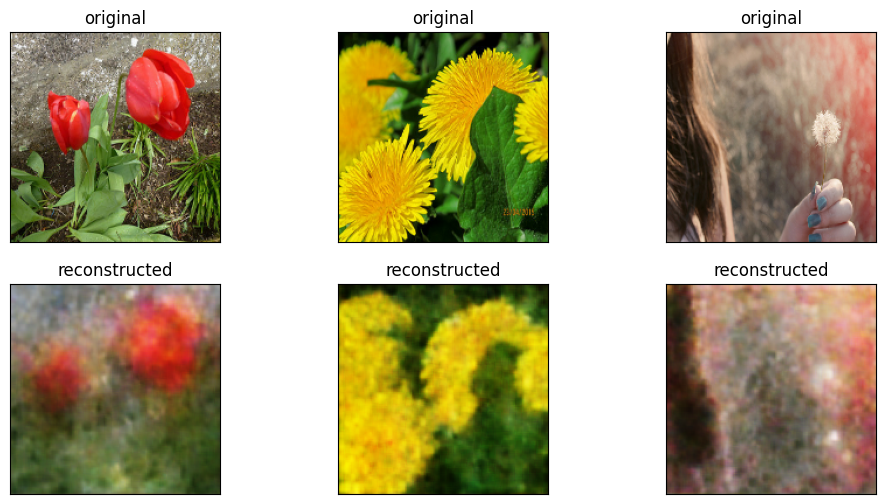


 Validation set:



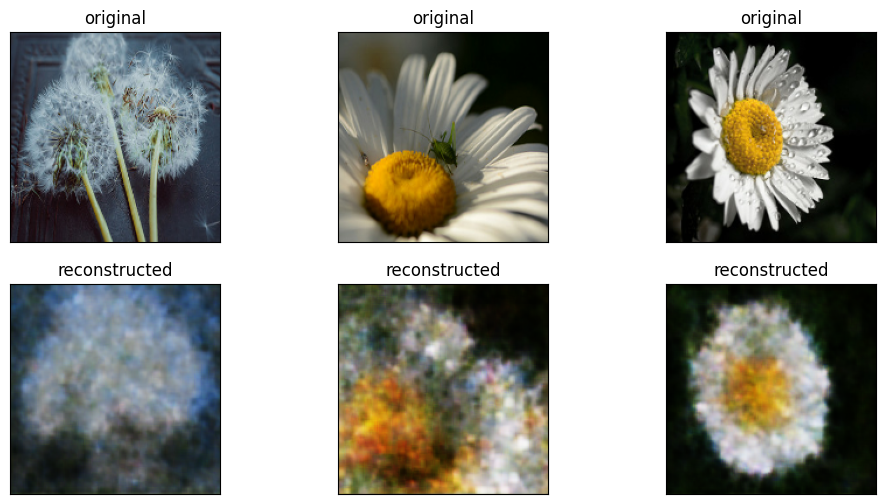

In [128]:
print("Train set:\n")
image_plot(original_train_3imgs, decoded_train_3imgs_n5, 3)

print("\n Validation set:\n")
image_plot(original_val_3imgs, decoded_val_3imgs_n5, 3)

### 10%

In [129]:
noise10_train = tf.keras.layers.GaussianNoise(0.10)(original_train_3imgs,training=True)
encoded_train_3imgs_n10 = autoencoder.encoder(noise10_train).numpy()
decoded_train_3imgs_n10 = autoencoder.decoder(encoded_train_3imgs_n10).numpy()

noise10_val = tf.keras.layers.GaussianNoise(0.10)(original_val_3imgs,training=True)
encoded_val_3imgs_n10 = autoencoder.encoder(noise10_val).numpy()
decoded_val_3imgs_n10 = autoencoder.decoder(encoded_val_3imgs_n10).numpy()

Train set:



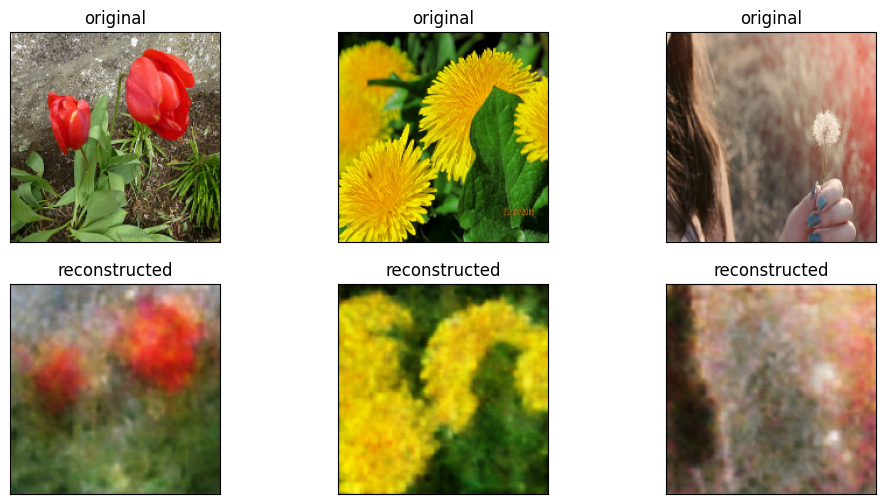


 Validation set:



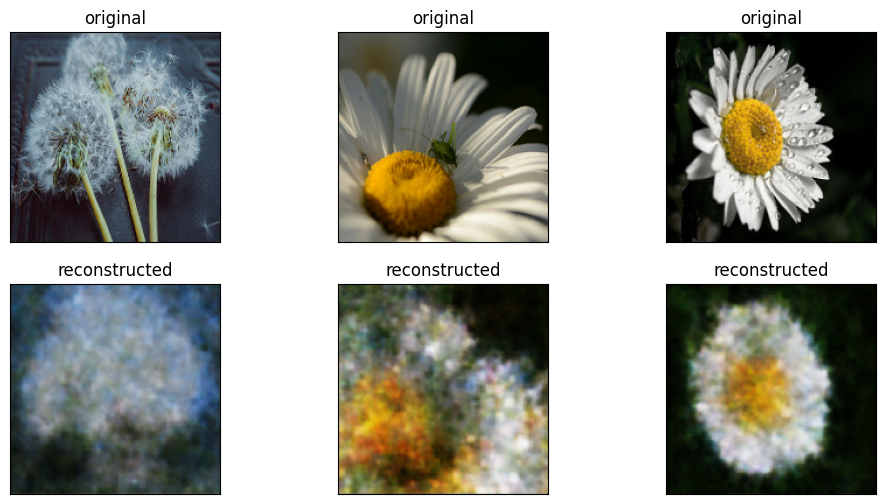

In [130]:
print("Train set:\n")
image_plot(original_train_3imgs, decoded_train_3imgs_n10, 3)

print("\n Validation set:\n")
image_plot(original_val_3imgs, decoded_val_3imgs_n10, 3)

### 20%

In [131]:
noise20_train = tf.keras.layers.GaussianNoise(0.20)(original_train_3imgs,training=True)
encoded_train_3imgs_n20 = autoencoder.encoder(noise20_train).numpy()
decoded_train_3imgs_n20 = autoencoder.decoder(encoded_train_3imgs_n20).numpy()

noise20_val = tf.keras.layers.GaussianNoise(0.20)(original_val_3imgs,training=True)
encoded_val_3imgs_n20 = autoencoder.encoder(noise20_val).numpy()
decoded_val_3imgs_n20 = autoencoder.decoder(encoded_val_3imgs_n20).numpy()

Train set:



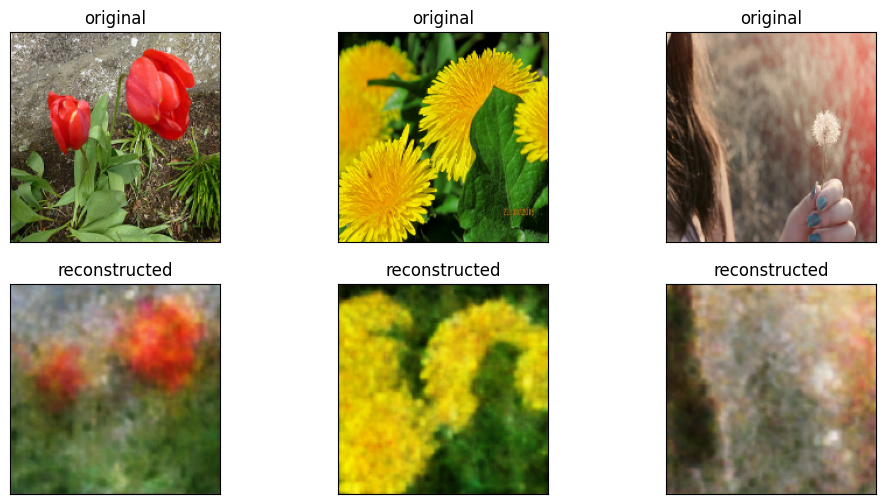


 Validation set:



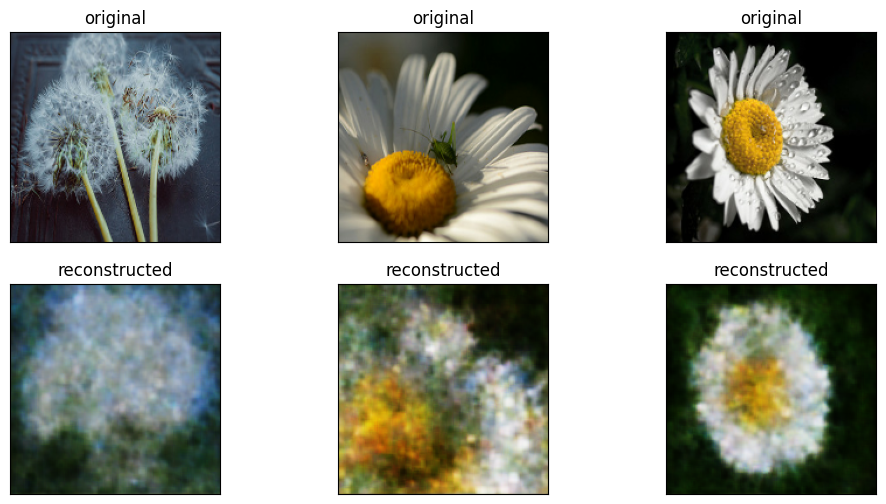

In [132]:
print("Train set:\n")
image_plot(original_train_3imgs, decoded_train_3imgs_n20, 3)

print("\n Validation set:\n")
image_plot(original_val_3imgs, decoded_val_3imgs_n20, 3)

Having introduced the noise layer at the input instead of in the intermediate phase has theoretically a stronger effect in distorting an image because the autoencoder in it's attempt to construct and reconstruct the image its been "fed" will work on an image that started with noise which means it will attempt to represent these very points that are not representative of the original image in the first place in a less condensed way (as it is how the convolutional layer works). This should result in even more distorted images, but as mentioned above the percentages the autoencoder utilises may not be enough to make this difference apparent but also the nature of the image set itself can play a part in making these differences not so distinguishable.